<div style="text-align: center;">
  <h1>TA145 - Redes Neuronales y Aprendizaje Profundo</h1>
  <h2>Trabajo Práctico 3: Red de Kohonen</h2>
</div>

---
---

<div style="text-align: left;">
  <h3><b>Introducción</b></h3>
</div>

---
---

<div style="text-align: left;">
  <h3><b>Base Teórica</b></h3>
</div>

---
---

<div style="text-align: left;">
  <h3><b>Desarrollo</b></h3>
</div>

<div style="text-align: left;">
  <h3><b>Librerías utilizadas</b></h3>
</div>



In [5]:
# --- Basic Imports ---
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import HTML, display
from typing import Tuple
import time

# # --- Deep Learning Imports (Pytorch) ---
# import torch 
# import torch.nn as nn
# import torch.nn.functional as F
# from torch.utils.data import DataLoader
# from torchvision import transforms, datasets

<div style="text-align: left;">
  <h4><b>Ejercicio 1</b></h4>
</div>

**Construya una red de Kohonen de $2$ entradas que aprenda una distribución uniforme dentro del círculo unitario. Mostrar el mapa de preservación de topología. Probar con distribuciones uniformes dentro de otras figuras geométricas.**

In [103]:
class GridKohonenNetwork():
    def __init__(self, network_size) -> None:
        if len(network_size) != 2:
            raise ValueError("network_size must be a tuple of two integers.")

        self.network_size = network_size
        self.weights = None

    def __initialize_weights(self, input) -> np.ndarray:
        """
        Initialize the weights of the Kohonen network.
        """
        n_neurons = self.network_size[0] * self.network_size[1]
        n_samples, n_features = input.shape
        replace = n_samples < n_neurons
        
        idx_w = np.random.choice(n_samples, n_neurons, replace=replace)
        weights = input[idx_w] + np.random.normal(0, 0.01, (n_neurons, n_features))
        
        return weights.reshape(*self.network_size, n_features)

    def __best_matching_unit(self, input_sample) -> Tuple[int, int]:
        """
        Find the Best Matching Unit (BMU) for a given input sample.
        """
        distances = np.linalg.norm(self.weights - input_sample, axis=2)
        bmu_index = np.unravel_index(np.argmin(distances, axis=None), distances.shape)
        return bmu_index

    def __params_decay(self, learning_rate, radio, epoch, max_epochs) -> Tuple[float, float]:
        return [learning_rate * np.exp(-epoch / max_epochs), radio * np.exp(-epoch / max_epochs)]

    def train(self, input, learning_rate, radio, max_epochs=100) -> None:
        """
        Train the Kohonen network using the given input values.
        """
        if input is None or len(input) == 0:
            raise ValueError("Input data cannot be None or empty.")

        if learning_rate <= 0 or learning_rate > 1:
            raise ValueError("Learning rate must be in the range (0, 1].")

        grid_coords = np.indices(self.network_size).transpose(1, 2, 0)
        self.weights = self.__initialize_weights(input)
        
        epoch = 0
        early_stop = False
        while epoch < max_epochs and not early_stop:
            new_lr, new_rad = self.__params_decay(learning_rate, radio, epoch, max_epochs)
            if new_rad < 1:
                early_stop = True
            
            for input_sample in input:
                bmu_index = self.__best_matching_unit(input_sample)    
                distances = np.linalg.norm(grid_coords - bmu_index, axis=2) ** 2

                neighbor_influence = np.exp(-distances / (2 * (new_rad ** 2)))[:, :, np.newaxis]
                self.weights += new_lr * neighbor_influence * (input_sample - self.weights)
            
            epoch += 1

    def get_map(self) -> np.ndarray:
        """
        Returns the weight map of the Kohonen network.
        """
        return self.weights

    def unified_distance_matrix(self) -> np.ndarray:
        """
        Calculate the Unified Distance Matrix (U-Matrix) of the Kohonen network.
        """
        rows, cols, _ = self.weights.shape
        
        u_matrix = np.zeros((rows, cols))
        counts = np.zeros((rows, cols))
        
        diff_v = np.linalg.norm(self.weights[:-1] - self.weights[1:], axis=2)
        diff_h = np.linalg.norm(self.weights[:, :-1] - self.weights[:, 1:], axis=2)
        
        u_matrix[:-1, :] += diff_v
        counts[:-1, :] += 1
        
        u_matrix[1:, :] += diff_v
        counts[1:, :] += 1
        
        u_matrix[:, :-1] += diff_h
        counts[:, :-1] += 1
        
        u_matrix[:, 1:] += diff_h
        counts[:, 1:] += 1
        
        return u_matrix / counts

In [61]:
def generate_geometric_data(figure_name, n_samples) -> np.ndarray:
    """
    Generates geometric data based on the specified figure.
    Supported figures: 'circle', 'square', 'triangle'
    """
    supported_figures = ['circle', 'square', 'triangle']
    if figure_name not in supported_figures:
        raise ValueError(f"Unsupported figure: {figure_name}. Supported figures are: {supported_figures}")

    if figure_name == 'circle':
        theta, r = np.random.uniform(0, 2 * np.pi, n_samples), np.sqrt(np.random.uniform(0, 1, n_samples))
        x, y = r * np.cos(theta), r * np.sin(theta)
        return np.column_stack((x, y))
    
    elif figure_name == 'square':
        x, y = np.random.uniform(-1, 1, n_samples), np.random.uniform(-1, 1, n_samples)
        return np.column_stack((x, y))
    
    elif figure_name == 'triangle':
        points = []
        while len(points) < n_samples:
            x, y = np.random.uniform(0, 1, 2)
            if y <= 1 - x:
                points.append((x, y))
        return np.array(points)

In [120]:
def plot_kohonen_map(ax, kohonen_network, data, title="Kohonen Network Weight Map") -> None:
    """
    Plots the weight map of the Kohonen network.
    """
    weights = kohonen_network.get_map()
    rows, cols, _ = weights.shape
    
    ax.scatter(data[:, 0], data[:, 1], c='#6e9987', marker='.', label='Input Data', zorder=1)

    ax.scatter(weights[:, :, 0], weights[:, :, 1], c='#27191c', marker='o', label='Neurons', zorder=3)
    for row in range(rows): ax.plot(weights[row, :, 0], weights[row, :, 1], c='#27191c', zorder=2)
    for col in range(cols): ax.plot(weights[:, col, 0], weights[:, col, 1], c='#27191c', zorder=2)

    ax.set_title(title)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5, zorder=0)

def plot_map_loop(geometric_figures, network_sizes, radios, learning_rates, max_epochs=100) -> None:
    """
    Plots Kohonen network weight maps for various configurations.
    """
    for geo_fig in geometric_figures:
        data = generate_geometric_data(geo_fig, 1000)
        
        for size in network_sizes:
            fig, axes = plt.subplots(len(radios), len(learning_rates), figsize=(16, 10), squeeze=False)
            fig.suptitle(f"Figure: {geo_fig.capitalize()} | Network Size: {size}", fontsize=16, fontweight='bold')
            
            for i, r in enumerate(radios):
                for j, lr in enumerate(learning_rates):
                    KN = GridKohonenNetwork(network_size=size)
                    KN.train(data, learning_rate=lr, radio=r, max_epochs=max_epochs)
                    plot_kohonen_map(axes[i, j], KN, data, title=f"R={r}, LR={lr}")
            
            plt.tight_layout(rect=[0, 0.03, 1, 0.98])
            plt.show()

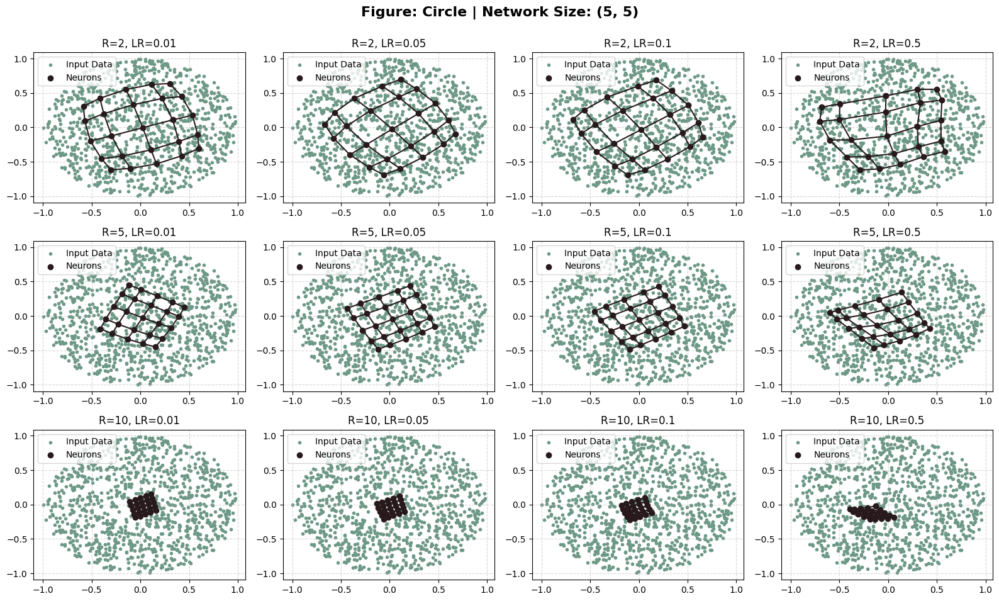

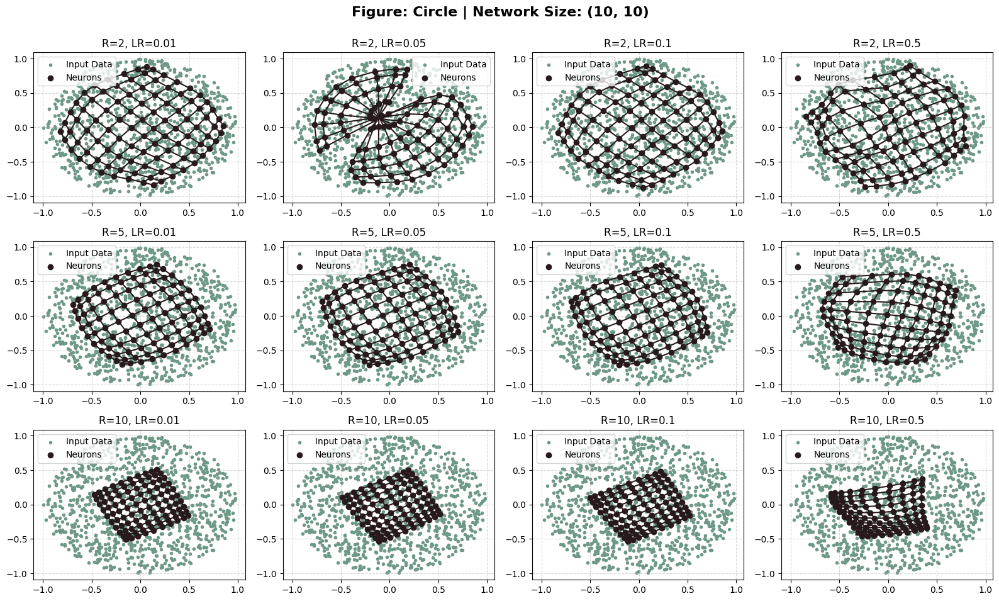

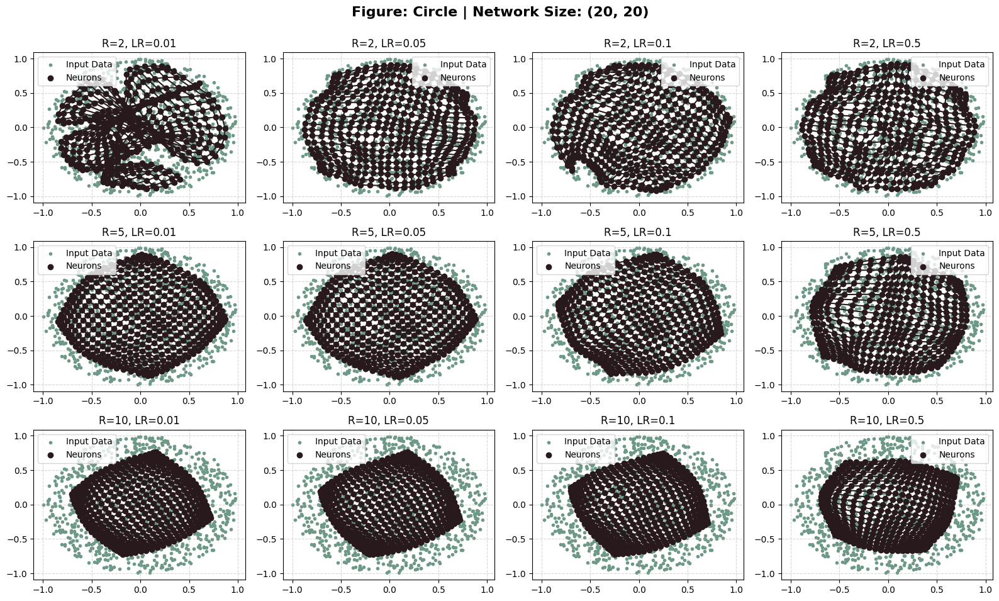

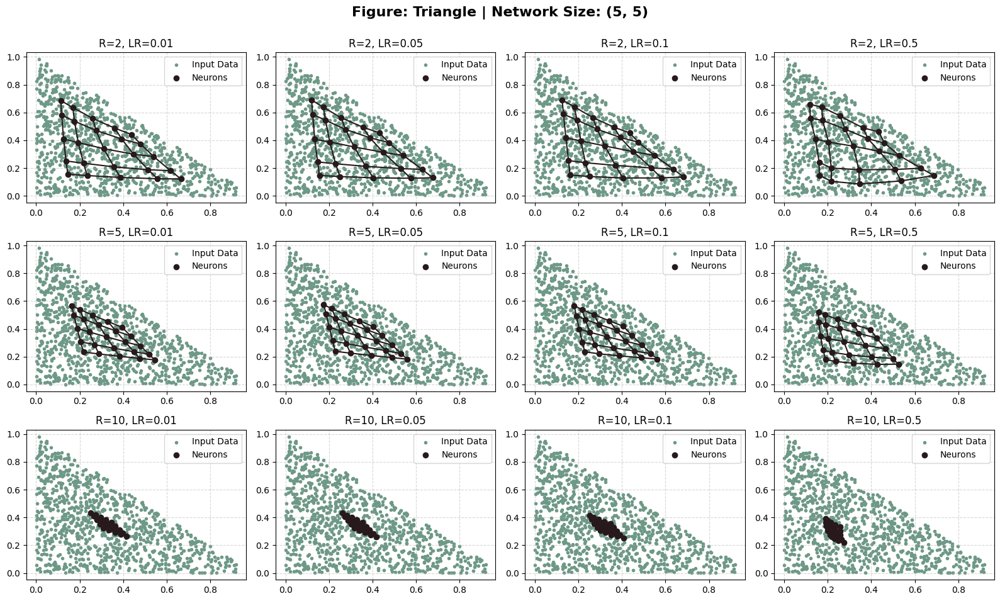

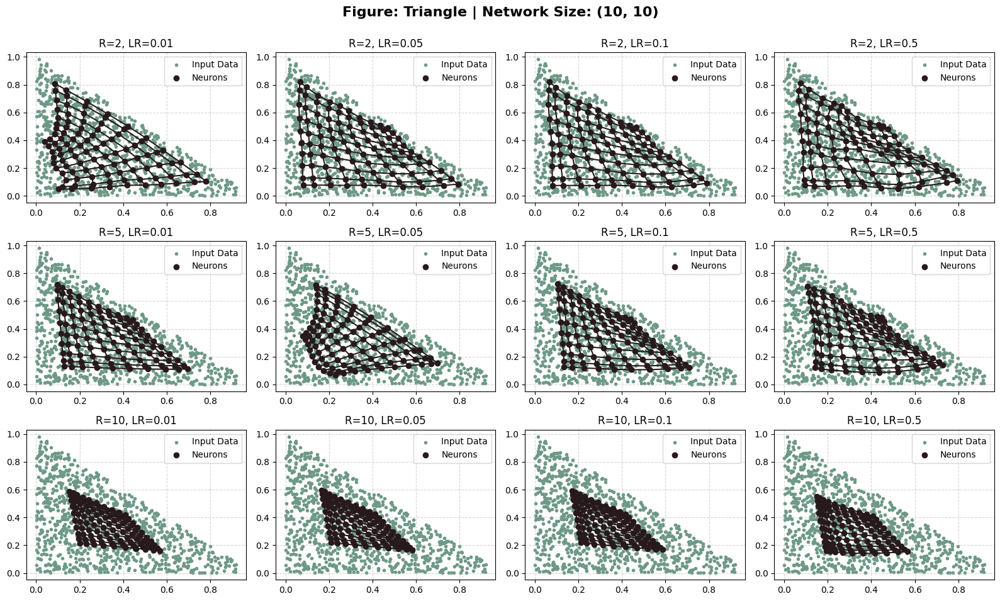

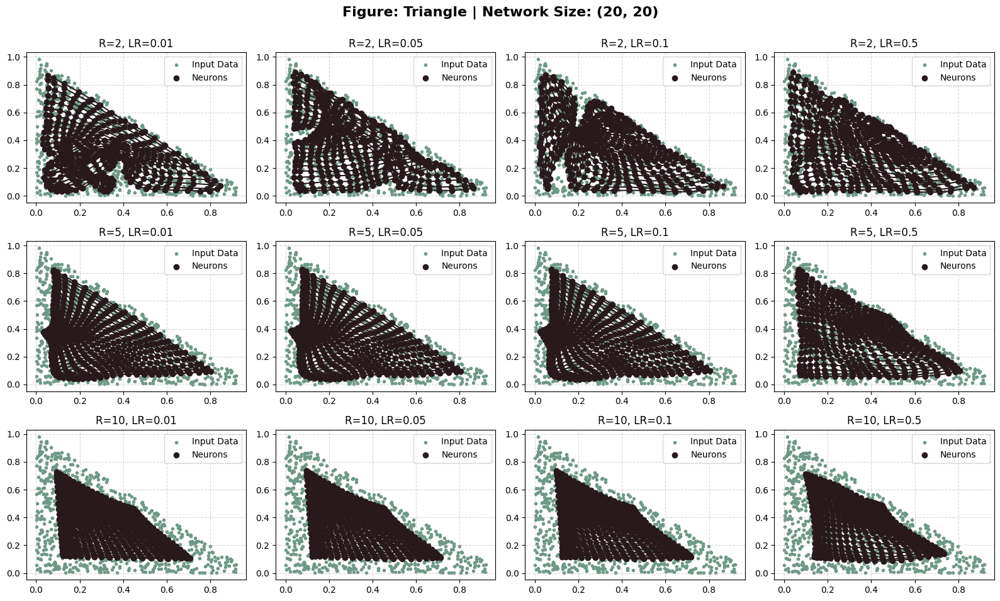

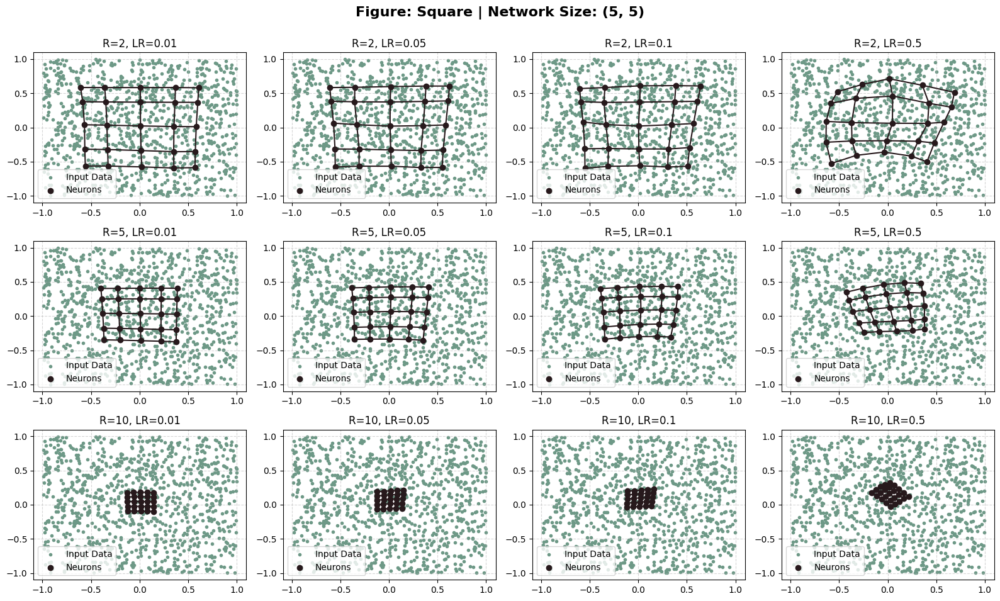

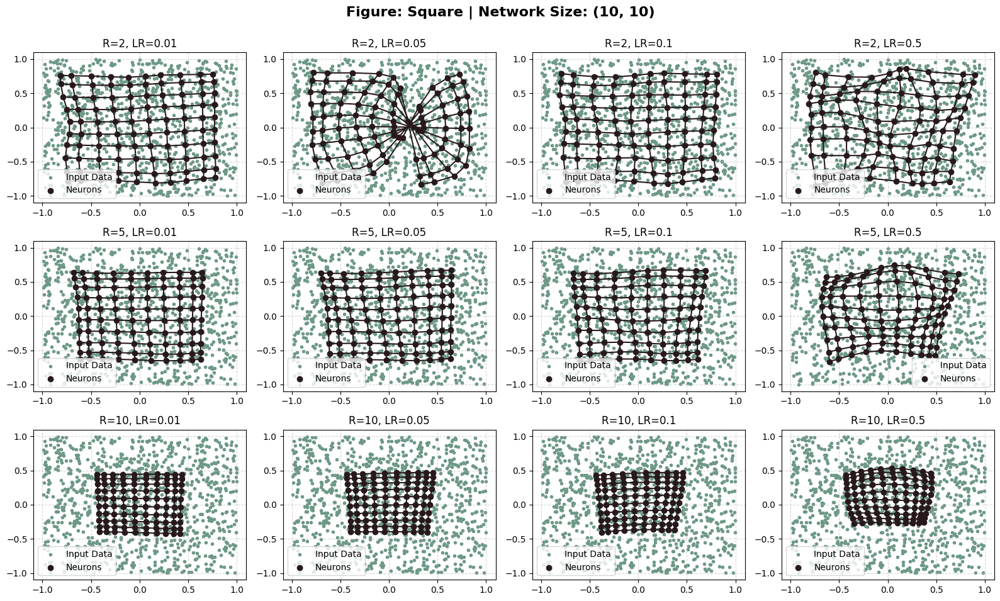

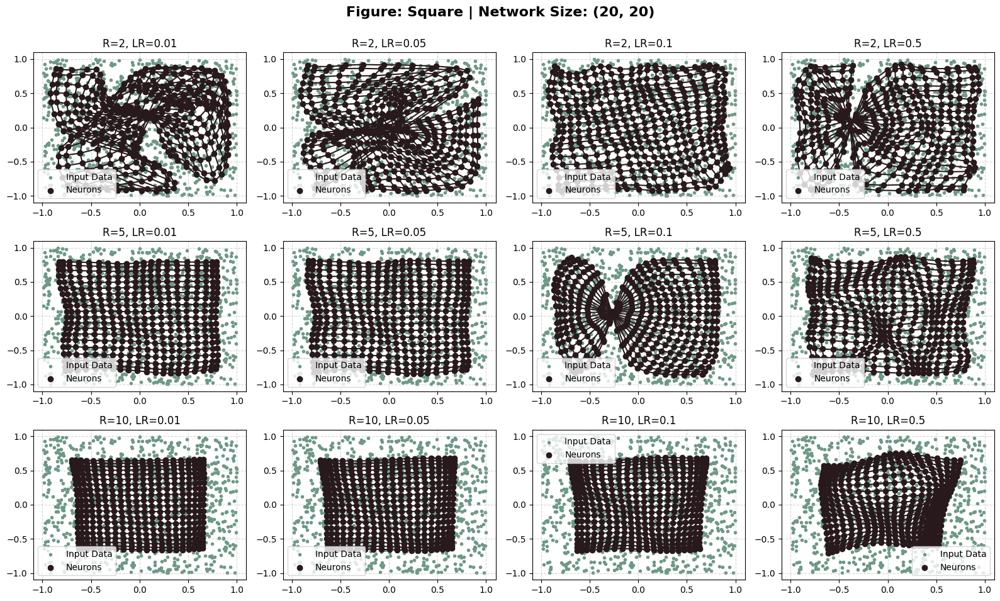

In [90]:
geometric_figures = ['circle', 'triangle', 'square']
network_sizes = [(5, 5), (10, 10), (20, 20)]
radios = [2, 5, 10]       
learning_rates = [0.01, 0.05, 0.1, 0.5] 

plot_map_loop(geometric_figures, network_sizes, radios, learning_rates)

KeyboardInterrupt: 

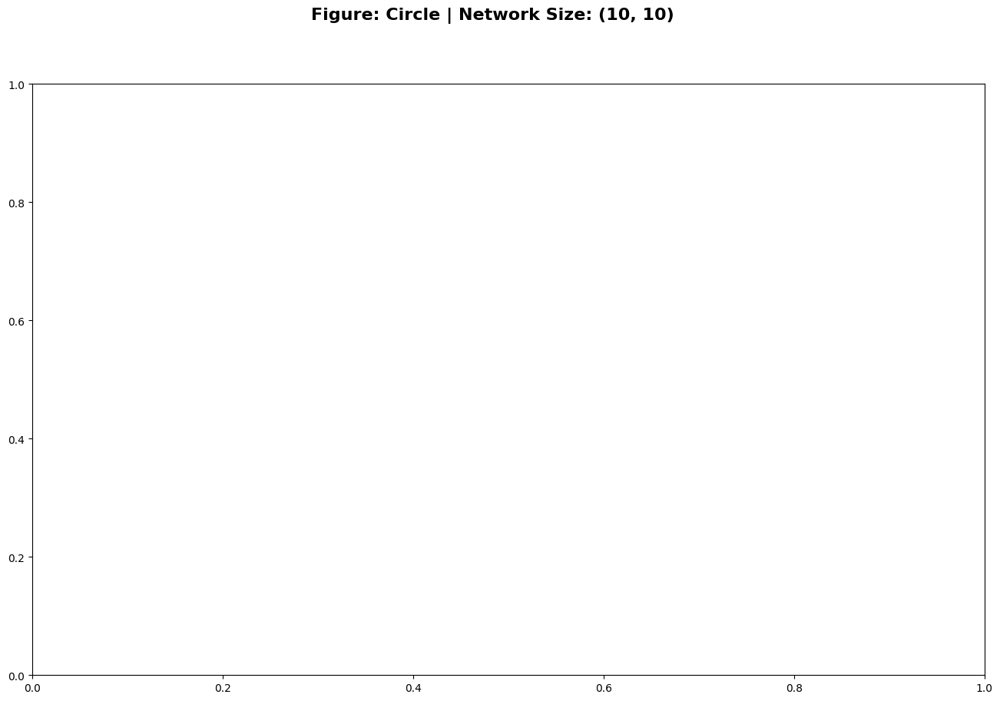

In [124]:
network_size = [(10, 10)]
learning_rate = [0.1]
radio = [2]

plot_map_loop(geometric_figures, network_size, radio, learning_rate, max_epochs=100000)

<div style="text-align: left;">
  <h4><b>Ejercicio 2</b></h4>
</div>

**Resuelva aproximadamente el “Traveling salesman problem” para $200$ ciudades con una red de Kohonen.**

In [65]:
class TSPKohonenNetwork():
    def __init__(self, n_neurons) -> None:
        if n_neurons <= 0:
            raise ValueError("n_neurons must be a positive integer.")

        self.n_neurons = n_neurons
        self.weights = None

    def __initialize_weights(self, input) -> np.ndarray:
        """
        Initialize the weights of the Kohonen network as a small ring in the center.
        """
        centroid = np.mean(input, axis=0)
        radius = np.max(np.std(input, axis=0)) * 0.1
        angles = np.linspace(0, 2 * np.pi, self.n_neurons, endpoint=False)
        
        x_coords, y_coords = centroid[0] + radius * np.cos(angles), centroid[1] + radius * np.sin(angles)
        return np.column_stack([x_coords, y_coords])

    def __best_matching_unit(self, input_sample) -> int:
        """
        Find the Best Matching Unit (BMU) index for a given input sample.
        """
        distances = np.linalg.norm(self.weights - input_sample, axis=1)
        return np.argmin(distances)

    def __params_decay(self, learning_rate, radio, epoch, max_epochs) -> Tuple[float, float]:
        return [learning_rate * np.exp(-epoch / max_epochs), radio * np.exp(-epoch / max_epochs)]

    def train(self, input, learning_rate, radio, max_epochs=100) -> None:
        """
        Train the Kohonen network using the given input values (cities).
        """
        if input is None or len(input) == 0:
            raise ValueError("Input data cannot be None or empty.")

        if learning_rate <= 0 or learning_rate > 1:
            raise ValueError("Learning rate must be in the range (0, 1].")

        self.weights = self.__initialize_weights(input)
        neuron_indices = np.arange(self.n_neurons)
        
        epoch = 0
        early_stop = False
        while epoch < max_epochs and not early_stop:
            new_lr, new_rad = self.__params_decay(learning_rate, radio, epoch, max_epochs)
            if new_rad < 1:
                early_stop = True

            shuffled_idx = np.random.permutation(len(input))
            shuffled_input = input[shuffled_idx]            
            
            for input_sample in shuffled_input:
                bmu_index = self.__best_matching_unit(input_sample)
                
                distances = np.abs(neuron_indices - bmu_index)
                circular_distances = np.minimum(distances, self.n_neurons - distances)
                
                neighbor_influence = np.exp(-(circular_distances ** 2) / (2 * (new_rad ** 2)))[:, np.newaxis]
                self.weights += new_lr * neighbor_influence * (input_sample - self.weights)
            
            epoch += 1

    def get_map(self) -> np.ndarray:
        """
        Returns the ordered weights representing the path.
        """
        return self.weights

In [77]:
def generate_cities(n_cities, mode) -> np.ndarray:
    """
    Generates city coordinates based on the specified mode.
    Supported modes: 'random', 'circle', 'clusters'
    """
    supported_modes = ['circle', 'random', 'clusters']
    if mode not in supported_modes:
        raise ValueError(f"Unsupported mode: {mode}. Supported modes are: {supported_modes}")
    
    if mode == 'random':
        return np.random.rand(n_cities, 2)

    elif mode == 'circle':
        theta, r = np.random.uniform(0, 2 * np.pi, n_cities), np.sqrt(np.random.uniform(0, 1, n_cities))
        x, y = r * np.cos(theta), r * np.sin(theta)
        return np.column_stack((x, y))
    
    elif mode == 'clusters':
        data = []
        n_clusters = max(2, n_cities // 10)
        
        it = 0
        while it < n_clusters:
            city_center = np.random.rand(2)
            near_places = city_center + np.random.normal(0, 0.05, (n_cities // n_clusters, 2))
            data.append(near_places)
            it += 1
        
        return np.vstack(data)


In [122]:
def plot_tsp_map(ax, kohonen_network, data, title="TSP Solution") -> None:
    """
    Plots the TSP Kohonen map.
    """
    weights = kohonen_network.get_map()
    
    ax.scatter(data[:, 0], data[:, 1], c='#6e9987', marker='.', label='Cities', zorder=1)

    route = np.vstack([weights, weights[0]])
    
    ax.plot(route[:, 0], route[:, 1], c='#27191c', linewidth=1.5, zorder=2, label='Route')
    ax.scatter(weights[:, 0], weights[:, 1], c='#27191c', marker='x', s=15, zorder=3)

    ax.set_title(title)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.5, zorder=0)

def plot_tsp_loop(tsp_modes, radios, learning_rates, n_cities, n_neurons, max_epochs=500) -> None:
    """
    Plots thet TSP Kohonen map for various configurations.
    """
    for mode in tsp_modes:
        cities = generate_cities(n_cities, mode=mode)
        
        fig, axes = plt.subplots(len(radios), len(learning_rates), figsize=(20, 16), squeeze=False)
        fig.suptitle(f"TSP Mode: {mode.capitalize()} | Cities: {n_cities} | Neurons: {n_neurons}", fontsize=16, fontweight='bold')
        
        for i, r in enumerate(radios):
            for j, lr in enumerate(learning_rates):
                KN = TSPKohonenNetwork(n_neurons=n_neurons)
                KN.train(cities, learning_rate=lr, radio=r, max_epochs=max_epochs)
                plot_tsp_map(axes[i, j], KN, cities, title=f"R={r}, LR={lr}")
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.98])
        plt.show()

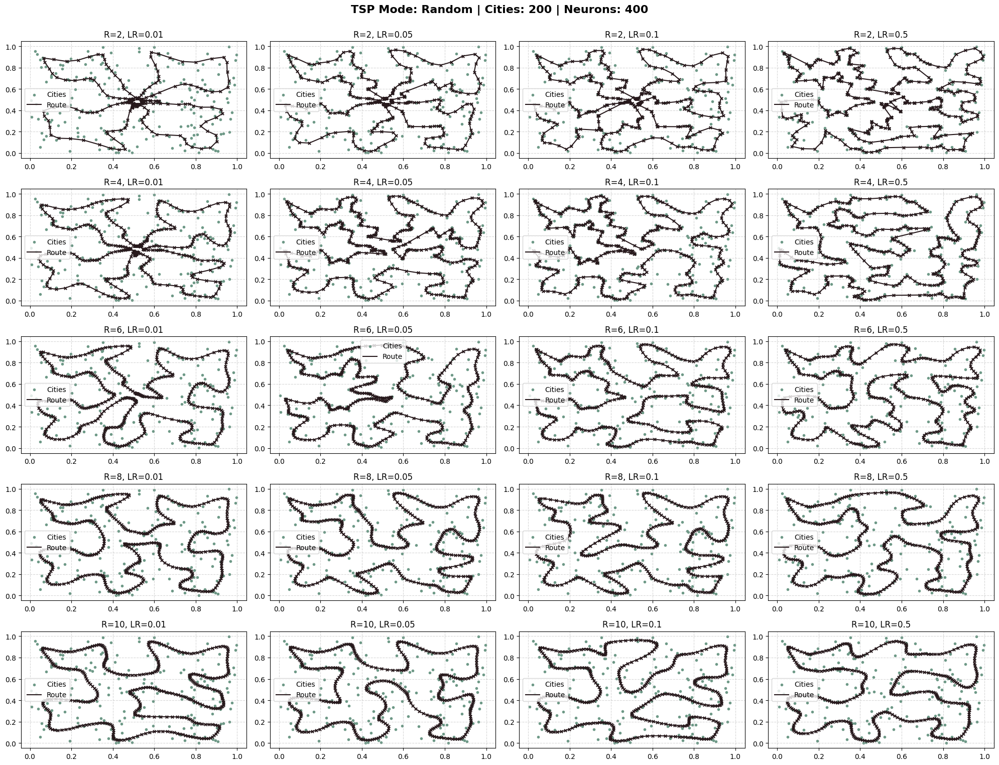

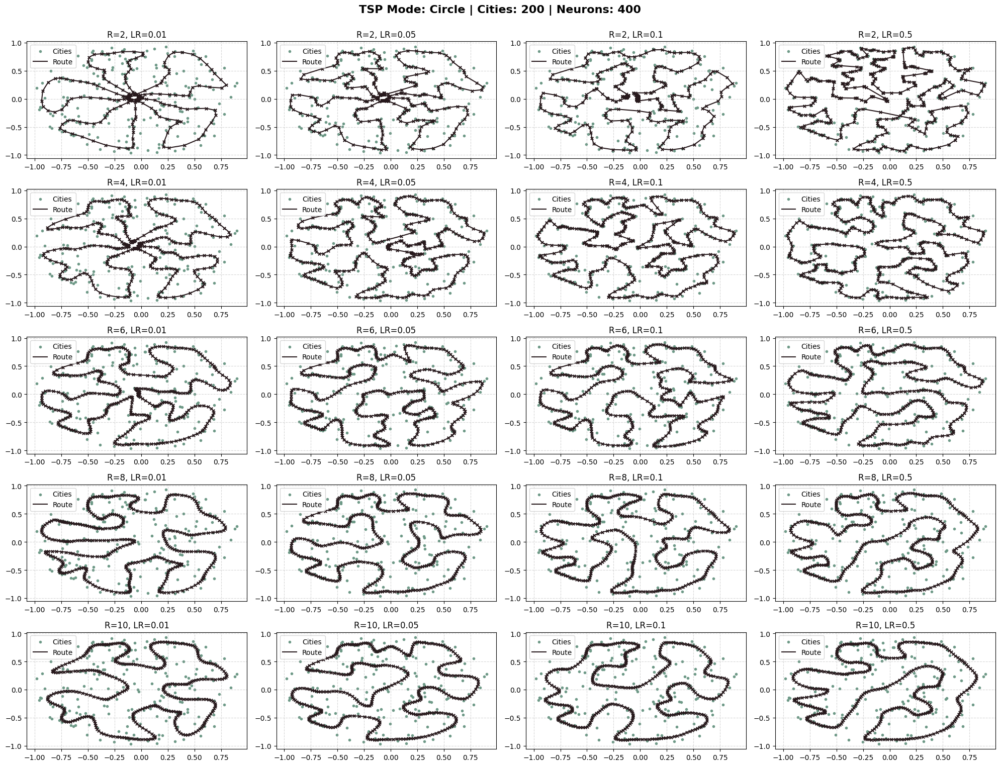

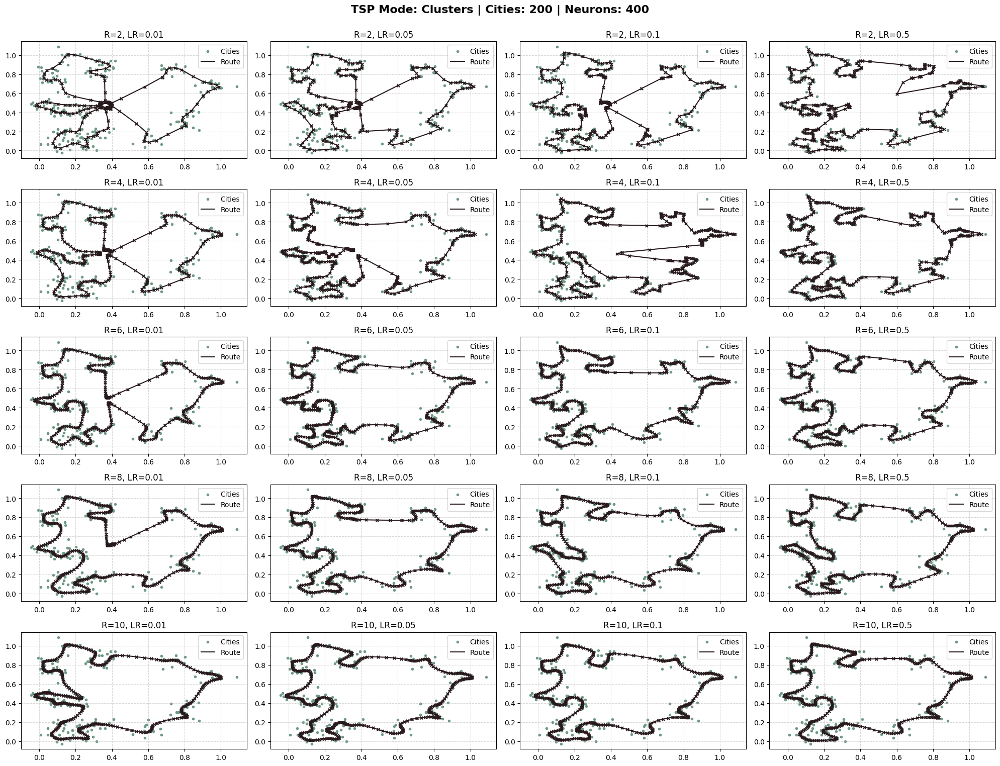

In [94]:
tsp_modes = ['random', 'circle', 'clusters']
radios = [2, 4, 6, 8, 10]    
learning_rates = [0.01, 0.05, 0.1, 0.5]

plot_tsp_loop(tsp_modes, radios, learning_rates, 200, 400)

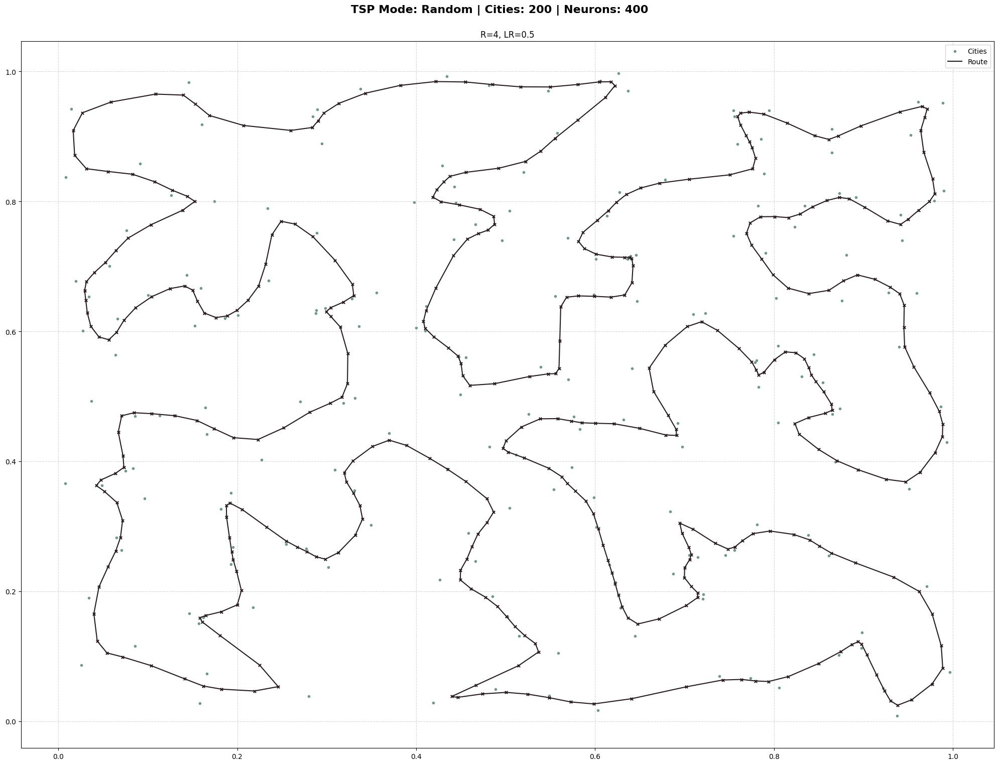

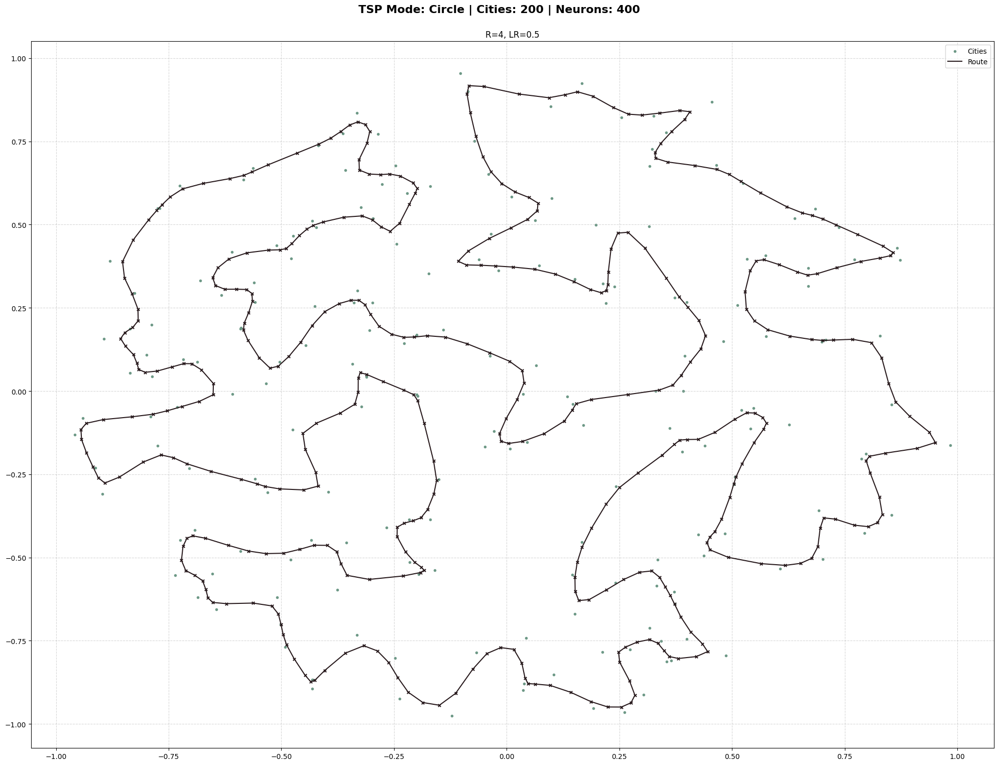

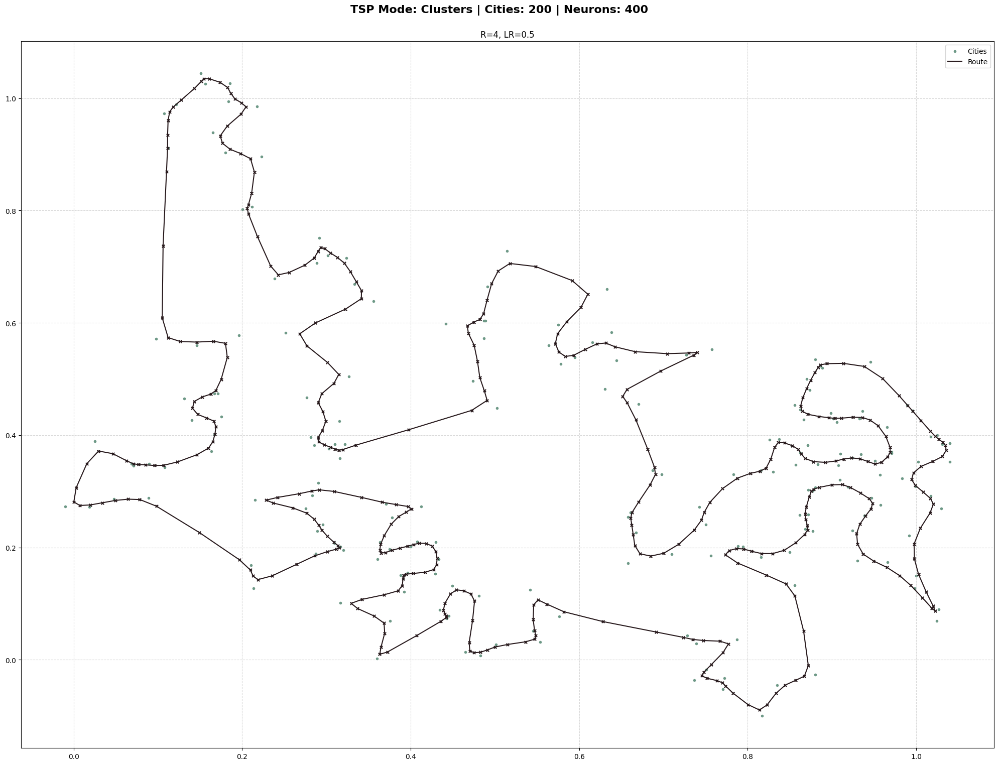

In [ ]:
learning_rate = [0.5]
radio = [4]

plot_tsp_loop(tsp_modes, radio, learning_rate, 200, 400, max_epochs=100000)

<div style="text-align: left;">
  <h4><b>Ejercicio 3</b></h4>
</div>

**En el campus encontrará el archivo $\texttt{datos\_para\_clustering.mat}$ que contiene una matriz de datos de $500$ mediciones de una variable de $100$ dimensiones.**

**(A). Utilice una red de Kohonen para reducir la dimensionalidad de los datos.**

**(B). Verifique la presencia de *clusters*, e indique cuantos puede visualizar, haciendo uso de la matriz $\textbf{U}$.**

In [102]:
from scipy.io import loadmat

path = 'Data/datos_para_clustering.mat'
data = loadmat(path)
valid_names = [key for key in data.keys() if not key.startswith('__')][0]

data = data[valid_names]
data_norm = (data - data.min(axis=0)) / (data.max(axis=0) - data.min(axis=0) + 1e-12) 

display(HTML(f"<b>Data shape: {data_norm.shape}</b>"))

In [116]:
def plot_umatrix(ax, kohonen_network, title="U-Matrix") -> None:
    """
    Plots the U-Matrix of the Kohonen network.
    """
    u_matrix = kohonen_network.unified_distance_matrix()
    
    im = ax.imshow(u_matrix, cmap='viridis', origin='lower', zorder=1)
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label='Mean Distance to Neighbors')

    ax.set_title(title)
    ax.grid(True, linestyle='--', alpha=0.5, zorder=0)

def plot_umatrix_loop(radios, learning_rates, network_sizes) -> None:
    """
    Plots U-Matrix for various configurations.
    """
    for size in network_sizes:
        fig, axes = plt.subplots(len(radios), len(learning_rates), figsize=(16, 10))
        fig.suptitle(f"U-Matrix | Network Size: {size}", fontsize=16, fontweight='bold')
        
        for i, r in enumerate(radios):
            for j, lr in enumerate(learning_rates):
                KN = GridKohonenNetwork(network_size=size)
                KN.train(data_norm, learning_rate=lr, radio=r, max_epochs=500)
                plot_umatrix(axes[i, j], KN, title=f"R={r}, LR={lr}")
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.98])
        plt.show()

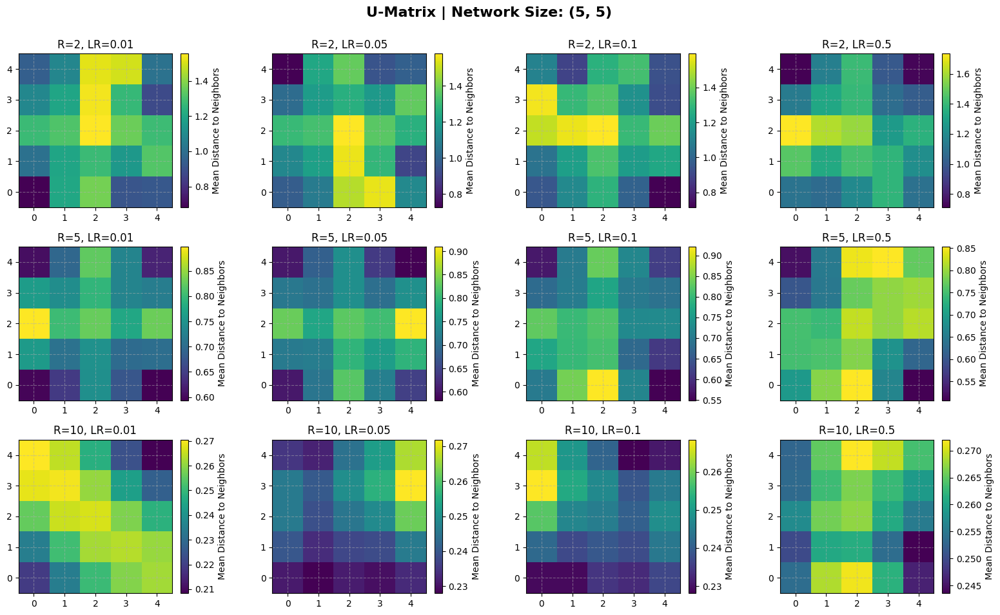

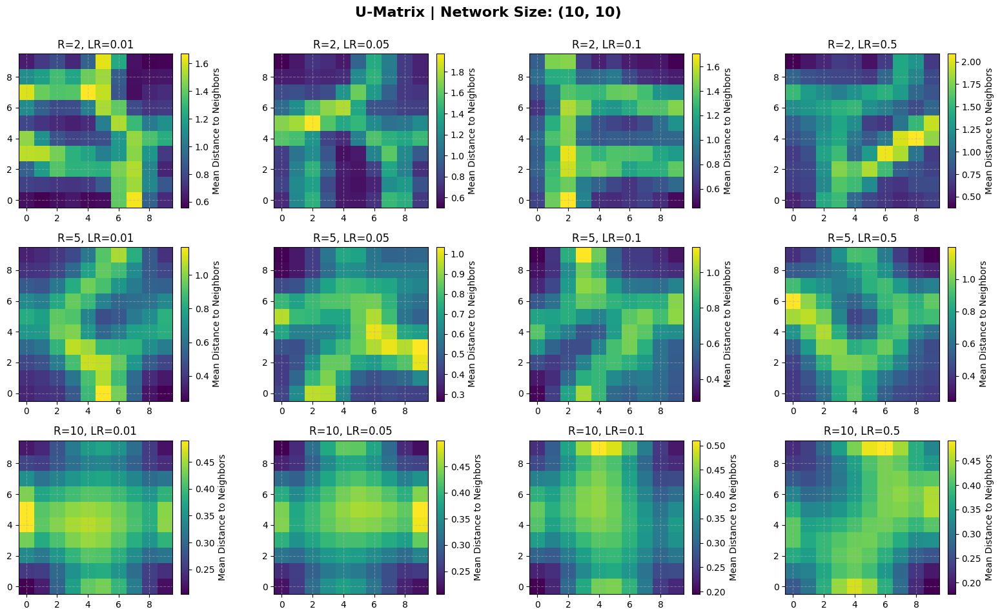

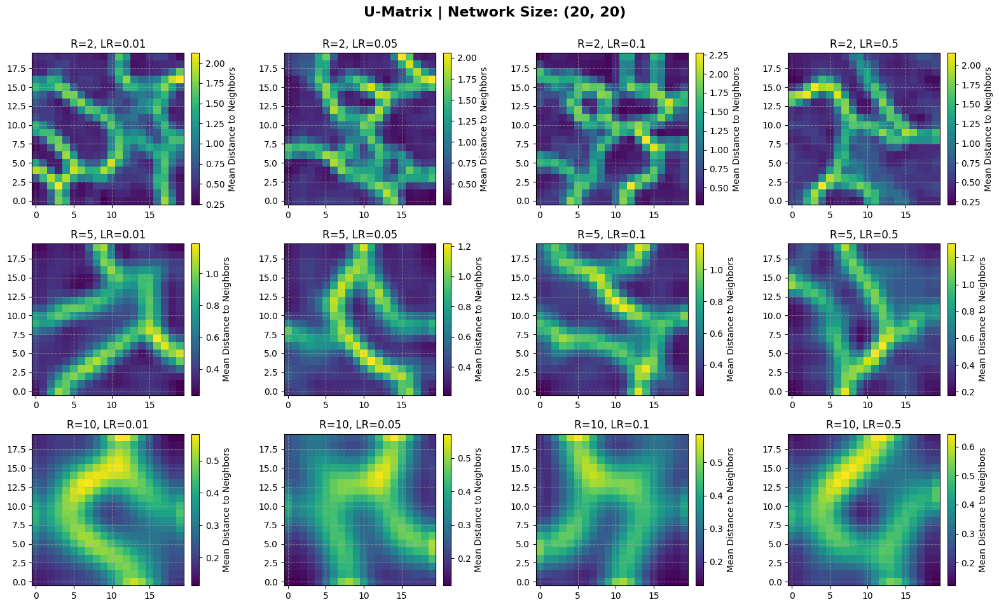

In [117]:
network_sizes = [(5, 5), (10, 10), (20, 20)]
radios = [2, 5, 10]       
learning_rates = [0.01, 0.05, 0.1, 0.5] 

plot_umatrix_loop(radios, learning_rates, network_sizes)

---
---

<div style="text-align: left;">
  <h3><b>Conclusiones</b></h3>
</div>